## 📜 Welcome Back, Visioneer
Having successfully passed through **Gate 1: The Chamber of Singular Truths**, you have proven your mastery of decomposition and reconstruction. The Grand Archivist nods approvingly:

"Well done, apprentice. You have learned to see the essential from the chaotic. Now you face Gate 2, where you must combine purification, detection, and recognition to unlock ancient secrets."

But the Archivist's warning echoes still:
"Beware. Those who attempt to pass with borrowed visions or false answers are cursed. Only true effort and understanding unlock the path forward."

## 🌀 Gate 2: Mosaic of Whispers
Theme: Image Denoising, Harris Corner Detection, Feature Matching

In the Gallery of Fragmented Memories, you find a beautiful Byzantine mosaic showing portraits of an ancient philosopher. As you admire it, Professor Dhoom Ketu steps out from the shadows, his wild hair floating and eyes full of mischief.

“Ah! The Mosaic of the Hidden Philosopher!” he says with a grin, handing you the preserved portrait. “This is your reference key.”

Suddenly, the Curse of Temporal Decay strikes—the rest of the mosaic is corrupted with noise and distortions. Professor Ketu sighs, “The curse again! Luckily, I saved the original before it was damaged. Now you can use this for your assignment.”

Run the following code to set things up:



# Assignment setup

In [1]:
## Importing recipes
%matplotlib inline

import imageio
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
# from google.colab import drive
from skimage.color import rgb2gray
# Mounting google drive
# drive.mount('/content/drive')


import matplotlib.pyplot as plt

def display_images_in_row(images, labels=None, cmap=None):
    """
    Display multiple images in a single row with labels below them.

    Args:
        images (list): List of images (numpy arrays or tensors convertible to numpy).
        labels (list, optional): List of labels corresponding to each image.
        cmap (str, optional): Colormap for displaying grayscale images.
    """
    num_images = len(images)
    print(f"Displaying {num_images} image{'s' if num_images > 1 else ''}")

    fig, axs = plt.subplots(1, num_images, figsize=(4 * num_images, 4))

    # Ensure axs is iterable
    if num_images == 1:
        axs = [axs]

    for i, (ax, img) in enumerate(zip(axs, images)):
        # Choose colormap
        if cmap is None:
            if img.ndim == 2 or (img.ndim == 3 and img.shape[2] == 1):
                ax.imshow(img.squeeze(), cmap="gray")
            else:
                ax.imshow(img)
        else:
            ax.imshow(img, cmap=cmap)

        ax.axis("off")

        # Add label below image if available
        if labels is not None and i < len(labels):
            ax.set_title(labels[i], fontsize=12, fontweight="bold", pad=10)

    plt.tight_layout()
    plt.show()


# Resize the original image to a smaller size
def resize_image(img, max_size=200):
    """Resize image while maintaining aspect ratio"""
    h, w = img.shape[:2]
    if max(h, w) > max_size:
        scale = max_size / max(h, w)
        new_h, new_w = int(h * scale), int(w * scale)
        resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
        return resized
    return img


## Making recipes
base_path = "./ES666/Assignment2/"
mosaic_path = os.path.join(base_path, "mosaic.jpg")
key_path = os.path.join(base_path, "key.jpg")

# Load images
mosaic = cv2.imread(mosaic_path)        # BGR format
key = cv2.imread(key_path)

# Convert to RGB for matplotlib display
mosaic_rgb = cv2.cvtColor(mosaic, cv2.COLOR_BGR2RGB)
key_rgb = cv2.cvtColor(key, cv2.COLOR_BGR2RGB)

# Also convert to grayscale (float [0,1]) if needed for processing
mosaic_gray = rgb2gray(mosaic_rgb)
key_gray = rgb2gray(key_rgb)
mosaic_rgb_rs = resize_image(mosaic_rgb, max_size=500)
mosaic_rgb_rs = mosaic_rgb_rs.astype(np.float32) / 255.0

# Mosaic and Key

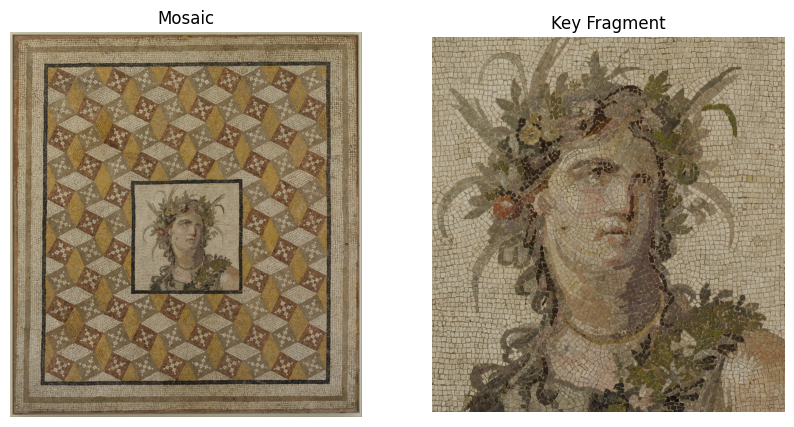

In [2]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(mosaic_rgb)
axs[0].set_title("Mosaic")
axs[0].axis("off")
axs[1].imshow(key_rgb)
axs[1].set_title("Key Fragment")
axs[1].axis("off")
plt.show()

### Task 1: Master the Arts of Purification (4 Marks)
Professor Ketu: "First, we must counteract the curse using the four sacred filtering techniques."

Implement the four denoising methods (mean, median, bilateral and gaussian) and compare their effectiveness:

In [3]:
# run this cell as it is

def add_gaussian_noise(img, mean=0, var=0.01):
    if img.dtype != np.float32:
        img = img.astype(np.float32) / 255.0

    sigma = var**0.5
    noise = np.random.normal(mean, sigma, img.shape).astype(np.float32)
    noisy_img = np.clip(img + noise, 0.0, 1.0)

    return noisy_img


def add_salt_pepper_noise(img, amount=0.05):

    noisy_img = img.copy()
    H, W, _ = noisy_img.shape

    num_noisy_pixels = int(amount * H * W)

    row_coords = np.random.randint(0, H, num_noisy_pixels)
    col_coords = np.random.randint(0, W, num_noisy_pixels)

    num_salt = num_noisy_pixels // 2

    noisy_img[row_coords[:num_salt], col_coords[:num_salt], :] = 1.0

    noisy_img[row_coords[num_salt:], col_coords[num_salt:], :] = 0.0

    return noisy_img

def generate_noisy_versions_rgb(img, gaussian_vars, sp_amounts):

    noisy_versions = {
        "gaussian": np.array([add_gaussian_noise(img, var=v) for v in gaussian_vars]),
        "salt_pepper": np.array([add_salt_pepper_noise(img, amount=a) for a in sp_amounts])
    }
    return noisy_versions

gaussian_vars = [0.001, 0.01, 0.05]       # variance levels
sp_amounts = [0.01, 0.05, 0.1]           # salt & pepper intensity

noisy_mosaic = generate_noisy_versions_rgb(mosaic_rgb_rs, gaussian_vars, sp_amounts)



Gaussian Noise with different variance
Displaying 3 images


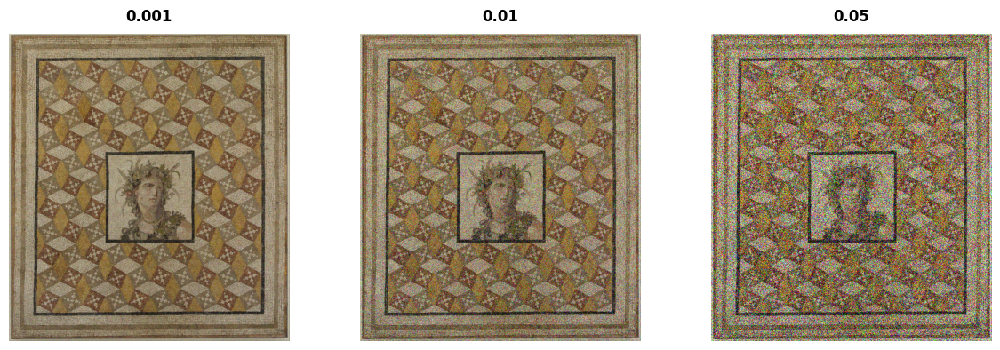

Salt and pepper Noise with different intensities
Displaying 3 images


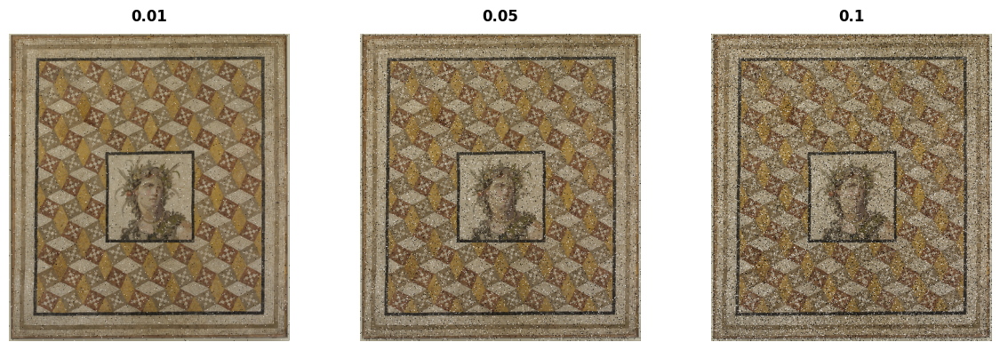

In [4]:
print("Gaussian Noise with different variance")
display_images_in_row(noisy_mosaic["gaussian"],labels=["0.001","0.01","0.05"])
print("Salt and pepper Noise with different intensities")
display_images_in_row(noisy_mosaic["salt_pepper"], labels=["0.01","0.05","0.1"])



### Implement filters here for all the noise levels

In [5]:
def conv2d(a, f):
    s = f.shape + tuple(np.subtract(a.shape, f.shape) + 1)
    print("s",s)
    strd = np.lib.stride_tricks.as_strided
    print("strd",strd)
    subM = strd(a, shape = s, strides = a.strides * 2)
    print("subM",subM,subM.shape)
    print("f",f)
    return np.einsum('ij,ijkl->kl', f, subM)

In [10]:
def conv(img,kernel):
  """
  this will convolve a kernel matrix over img with stride 1 and appropriate padding
  so that size remains same.
  applications is to apply filter over an image.

  input
    img : np.array
    kernel : np.array
  output
    result : np.array

  """
  if img.ndim < 3:
    img = img[...,np.newaxis]
  k = kernel.shape[0]
  padding=k//2
  p_img = np.pad(img, ((padding, padding), (padding, padding),(0,0)), mode='constant')
  result = np.zeros_like(img)
  for i in range(img.shape[0]):
    for j in range(img.shape[1]):
      x_low = i-k//2
      y_low = j-k//2
      x_high = x_low + k
      y_high = y_low +k
      if x_low<0 or y_low<0 or x_high>img.shape[0] or y_high>img.shape[1]:
        continue
      result[i,j]=np.sum(p_img[x_low:x_high,y_low:y_high]*kernel,axis=(0,1))
  return result


In [6]:
from logging import raiseExceptions
import numpy as np

def mean_filter(img, kernel_size=3):
    # Write your code
    if img.ndim == 2:
        img = img[..., np.newaxis]
    filtered= conv(img, np.ones((kernel_size, kernel_size, img.shape[2]))/(kernel_size*kernel_size))
    return filtered

def median_filter(img, kernel_size=3):
    # Write your code here
    if img.ndim == 2:
        img = img[..., np.newaxis]

    filtered = np.zeros_like(img)
    offset = kernel_size//2
    m,n= img.shape[0],img.shape[1]
    for i in range(m):
      for j in range(n):
        x_low= max(0,i-offset)
        y_low = max(0,j-offset)
        x_high = min(m-1, x_low + kernel_size)
        y_high = min(n-1, y_low + kernel_size)
        filtered[i,j] = np.median(img[x_low:x_high,y_low:y_high],axis=(0,1))
    return filtered

def gaussian_filter(img, kernel_size=5, sigma=1.0):
    # Write your code here
    if img.ndim == 2:
        img = img[..., np.newaxis]
    kernel= np.zeros((kernel_size,kernel_size,img.shape[2]))
    k=kernel_size//2
    kernel_x = [np.exp(-((i-k)**2)/2*sigma**2) for i in range(kernel_size)]
    kernel_y = kernel_x
    kernel = np.outer(kernel_x,kernel_y)
    kernel = kernel/np.sum(kernel)
    kernel = np.repeat(kernel[:,:,np.newaxis],3,axis = 2)
    filtered = conv(img,kernel)
    return filtered

def bilateral_filter(img, diameter=5, sigma_color=0.2, sigma_space=1.0):
    # Write your code here
    # its a combination of gaussian and intensity difference
    if img.ndim == 2:
        img = img[..., np.newaxis]

    k=diameter//2
    img_padded = np.pad(img, ((k, k), (k, k), (0, 0)), mode='reflect')
    gaussian_k = np.outer(np.exp(-np.arange(-k, k+1)**2/(2*sigma_space**2)), np.exp(-np.arange(-k, k+1)**2/(2*sigma_space**2)))
    gaussian_k = np.repeat(gaussian_k[:,:,np.newaxis],3,axis = 2)
    filtered = np.zeros_like(img)
    for i in range(img.shape[0]):
      for j in range(img.shape[1]):
        x_high = i+diameter
        y_high = j+diameter
        patch = img_padded[i:x_high,j:y_high]
        diff = (patch - img[i,j])**2
        idiff = np.exp(-diff/(2*sigma_color**2))
        w =np.sum(idiff*gaussian_k,axis=(0,1))
        filtered[i,j] = np.sum(idiff*gaussian_k*patch,axis = (0,1)) / w
    return np.clip(filtered, 0, 1)



In [7]:
img2 = bilateral_filter(mosaic_rgb_rs)

(500, 456, 3) (500, 456, 3)


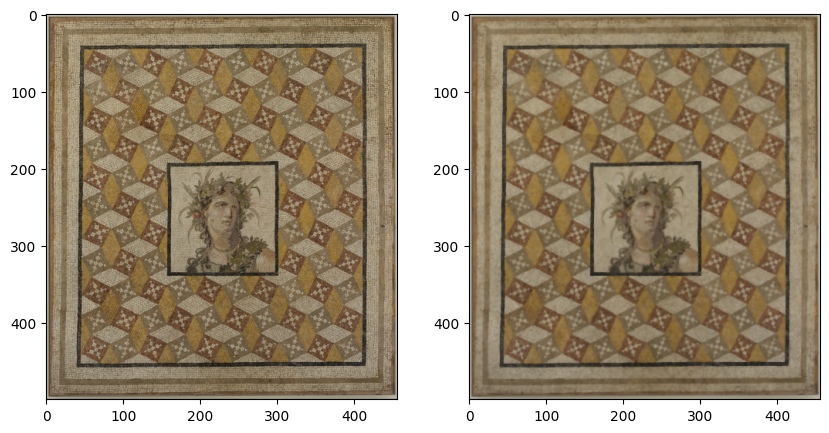

In [8]:
print(mosaic_rgb_rs.shape,img2.shape)
fig, ax =plt.subplots(1,2,figsize=(10,5))
ax[0].imshow(mosaic_rgb_rs)
ax[1].imshow(img2)


Row 1: gaussian noise (level=0.001)
Displaying 5 images


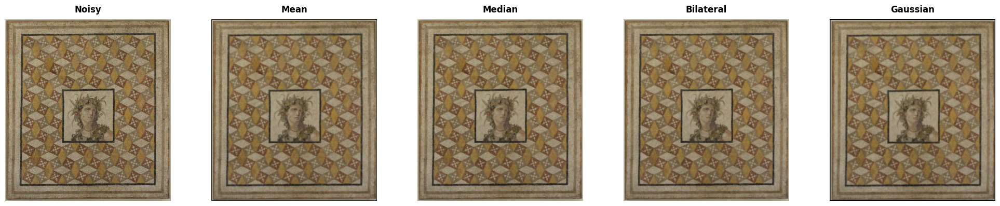

Row 2: gaussian noise (level=0.01)
Displaying 5 images


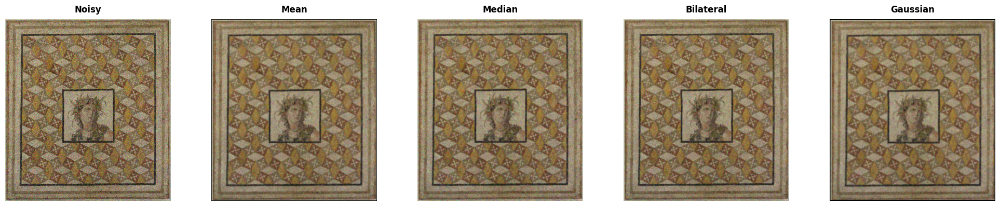

Row 3: gaussian noise (level=0.05)
Displaying 5 images


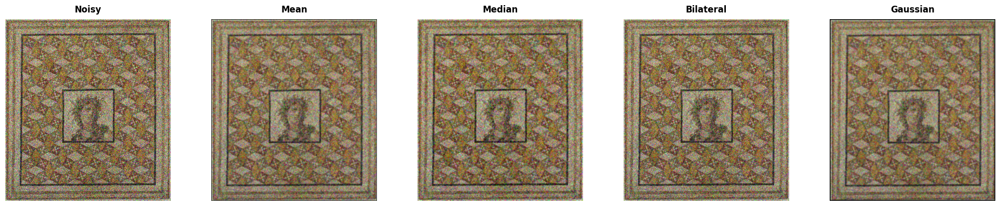

Row 4: salt_pepper noise (level=0.01)
Displaying 5 images


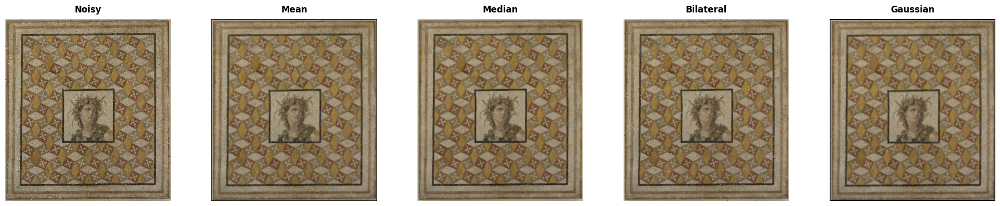

Row 5: salt_pepper noise (level=0.05)
Displaying 5 images


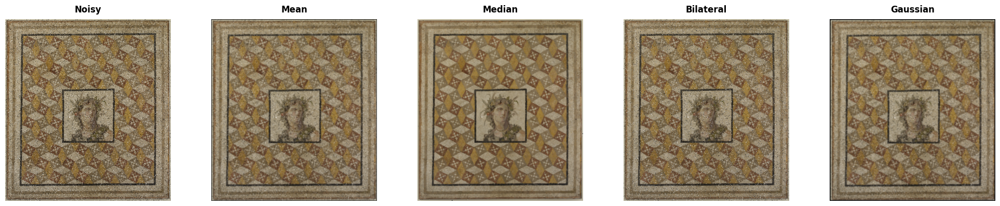

Row 6: salt_pepper noise (level=0.1)
Displaying 5 images


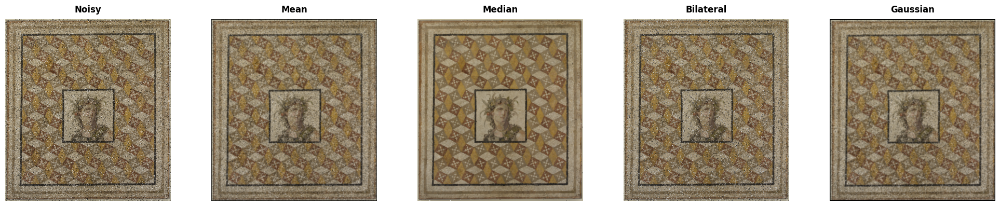

In [11]:
def test_filters_minimal( noisy_versions, filter_functions, filter_names):
    rows = []
    row_info = []  # keep track of (noise_type, param)

    noise_params = [
        ('gaussian', [0.001, 0.01, 0.05]),
        ('salt_pepper', [0.01, 0.05, 0.1])
    ]

    for noise_type, params in noise_params:
        for i, param in enumerate(params):
            noisy = noisy_versions[noise_type][i]
            denoised_imgs = [f(noisy) for f in filter_functions]
            row_imgs = [noisy] + denoised_imgs

            rows.append(row_imgs)
            row_info.append((noise_type, param))

    # Display all rows
    for i, (row_imgs, (noise_type, param)) in enumerate(zip(rows, row_info)):
        print(f"Row {i+1}: {noise_type} noise (level={param})")
        display_images_in_row(row_imgs, ["Noisy"] + filter_names)

    return rows, row_info

filter_functions = [mean_filter, median_filter, bilateral_filter, gaussian_filter]
filter_names = ['Mean', 'Median', 'Bilateral', 'Gaussian']


images, image_info =test_filters_minimal(noisy_mosaic, filter_functions, filter_names)

# you should find psnr or ssim as well to get a better understanding

In [12]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
import pandas as pd

# psnr for each image and noise type
original_image = mosaic_rgb_rs.copy()
results = []
for i, (row_imgs, (noise_type, param)) in enumerate(zip(images, image_info)):
    # Calculate PSNR and SSIM for the noisy image
    noisy_img = row_imgs[0]
    psnr_noisy = peak_signal_noise_ratio(original_image, noisy_img)
    ssim_noisy = structural_similarity(original_image, noisy_img, channel_axis=-1, data_range=noisy_img.max() - noisy_img.min())
    results.append({
        'Noise Type': noise_type,
        'Noise Level': param,
        'Filter': 'Noisy',
        'PSNR': psnr_noisy,
        'SSIM': ssim_noisy
    })

    # Calculate PSNR and SSIM for each denoised image
    for j, denoised_img in enumerate(row_imgs[1:]):
        filter_name = filter_names[j]
        psnr_denoised = peak_signal_noise_ratio(original_image, denoised_img)
        ssim_denoised = structural_similarity(original_image, denoised_img, channel_axis=-1, data_range=denoised_img.max() - denoised_img.min())
        results.append({
            'Noise Type': noise_type,
            'Noise Level': param,
            'Filter': filter_name,
            'PSNR': psnr_denoised,
            'SSIM': ssim_denoised
        })

results_df = pd.DataFrame(results)
display(results_df)
# get the best filter for each noise type and noise level combination
best_filters = results_df.loc[results_df[results_df["Filter"]!="Noisy"]\
                              .groupby(['Noise Type', 'Noise Level'])['PSNR'].idxmax()]
# best_filters = best_filters[best_filters['Filter'] != 'Noisy']

print("Best filter for each noise type and level based on PSNR:")
display(best_filters[['Noise Type', 'Noise Level', 'Filter', 'PSNR']])

best_filters_ssim = results_df.loc[results_df[results_df["Filter"]!="Noisy"]\
                                   .groupby(['Noise Type', 'Noise Level'])['SSIM'].idxmax()]
# best_filters_ssim = best_filters_ssim[best_filters_ssim['Filter'] != 'Noisy']

print("\nBest filter for each noise type and level based on SSIM:")
display(best_filters_ssim[['Noise Type', 'Noise Level', 'Filter', 'SSIM']])

,Noise Type,Noise Level,Filter,PSNR,SSIM
0,gaussian,0.001,Noisy,30.006478,0.892341
1,gaussian,0.001,Mean,20.844271,0.552319
2,gaussian,0.001,Median,26.507889,0.687249
3,gaussian,0.001,Bilateral,28.606751,0.792193
4,gaussian,0.001,Gaussian,17.798494,0.257280
5,gaussian,0.010,Noisy,20.031262,0.522493
6,gaussian,0.010,Mean,20.360237,0.494783
7,gaussian,0.010,Median,23.991854,0.581805
8,gaussian,0.010,Bilateral,25.137666,0.691844
9,gaussian,0.010,Gaussian,17.616115,0.232972


Best filter for each noise type and level based on PSNR:


,Noise Type,Noise Level,Filter,PSNR
3,gaussian,0.001,Bilateral,28.606751
8,gaussian,0.010,Bilateral,25.137666
12,gaussian,0.050,Median,19.628570
17,salt_pepper,0.010,Median,26.942296
22,salt_pepper,0.050,Median,26.693259
27,salt_pepper,0.100,Median,26.361142



Best filter for each noise type and level based on SSIM:


,Noise Type,Noise Level,Filter,SSIM
3,gaussian,0.001,Bilateral,0.792193
8,gaussian,0.010,Bilateral,0.691844
12,gaussian,0.050,Median,0.381642
18,salt_pepper,0.010,Bilateral,0.712208
22,salt_pepper,0.050,Median,0.726166
27,salt_pepper,0.100,Median,0.717677


📖 Theory Q: Question: Which filtering method works best for gaussian noise and which works for salt and pepper noise? Why?   
Ans: For gaussian noise, bilateral filter works best because it preserves edges while smoothing noise by considering both spatial distance and intensity similarity. For salt and pepper noise, median filter works best because it replaces each pixel with the median value in its neighborhood, effectively removing isolated noise spikes while preserving edges.

### Task 2: Detect the Points of Truth (3 Marks)
Professor Ketu: "Seek geometric truth in the original, not the corrupted version! The curse creates false corners."

Implement Harris Corner Detection on the pristine original image:

In [23]:
np.array([rgb2gray(mosaic_rgb)*255]).astype(np.uint8)

array([[[206, 203, 202, ..., 205, 173,   9],
        [202, 199, 197, ..., 197, 165,   2],
        [200, 198, 195, ..., 196, 164,   1],
        ...,
        [185, 174, 172, ..., 176, 163,   0],
        [204, 197, 201, ..., 207, 173,  20],
        [ 68,  62,  66, ...,  63,  58,   0]]],
      shape=(1, 3803, 3469), dtype=uint8)

Found 4282 corners in key image
Found 11014 corners in mosaic image
Displaying 2 images


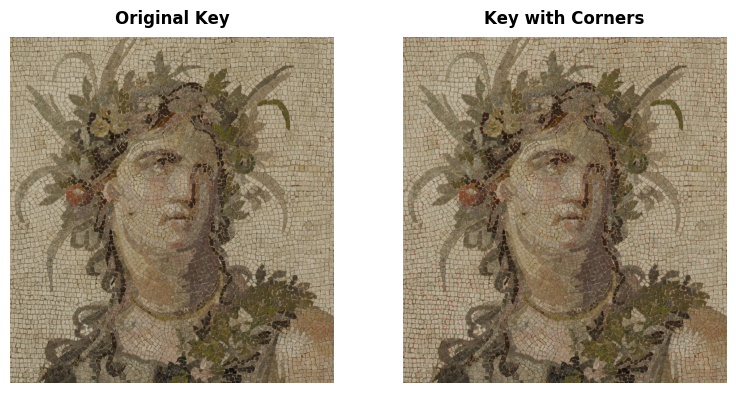

Displaying 2 images


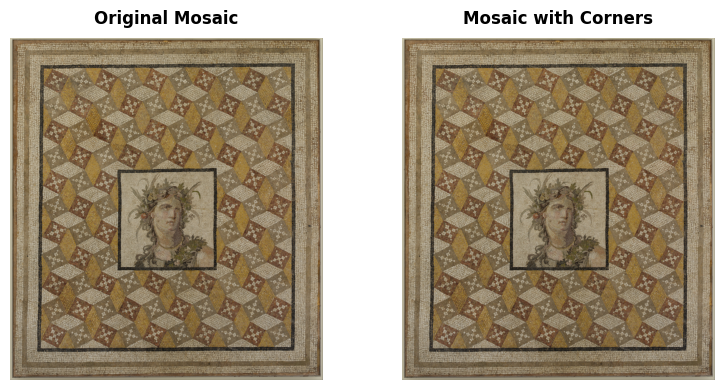

In [100]:
from tqdm import tqdm
def detect_harris_corner(image, k=0.04, threshold=0.01):
    """
    Implement Harris Corner Detection
    """
    # Convert to grayscale
    gray = rgb2gray(image).astype(np.float32)
    
    # Compute image gradients using Sobel operators
    Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    
    # Compute products of derivatives
    Ixx = Ix * Ix
    Iyy = Iy * Iy  
    Ixy = Ix * Iy
    
    # Apply box filter to smooth the derivatives
    Ixx = cv2.boxFilter(Ixx, ddepth=-1, ksize=(3,3), normalize=True)
    Iyy = cv2.boxFilter(Iyy, ddepth=-1, ksize=(3,3), normalize=True)
    Ixy = cv2.boxFilter(Ixy, ddepth=-1, ksize=(3,3), normalize=True)
    # Compute Harris response
    det_M = Ixx * Iyy - Ixy * Ixy
    trace_M = Ixx + Iyy
    R = det_M - k * (trace_M ** 2)
    # Find corner points
    corner_image = image.copy()
    corners = []
    
    # Threshold and non-maximum suppression
    corner_image = image.copy()
    corners = np.argwhere(R > threshold * R.max())
    corners_final = []
    for i,j in corners:
        if all(R[i,j] >= R[max(i-1,0):i+2, max(j-1,0):j+2].flatten()):
            corners_final.append((i,j))
    # Mark corners in red
    for i,j in corners_final:
        corner_image[i, j] = [255, 0, 0]  # Mark corner in red
    return corner_image, corners_final

key_harris, key_corners = detect_harris_corner(key_rgb,0.04,0.05)
mosaic_harris, mosaic_corners = detect_harris_corner(mosaic_rgb,0.04,0.05)

print(f"Found {len(key_corners)} corners in key image")
print(f"Found {len(mosaic_corners)} corners in mosaic image")

display_images_in_row([key_rgb, key_harris], ["Original Key", "Key with Corners"])
display_images_in_row([mosaic_rgb, mosaic_harris], ["Original Mosaic", "Mosaic with Corners"])

📖 Theory Q: What mathematical property of the Harris matrix allows it to distinguish between edges and corners?  
Ans: Edges will have one large eigenvalue and one small eigenvalue (indicating strong gradient in one direction), while corners have two large eigenvalues (indicating strong gradients in two perpendicular directions). The Harris detector uses the determinant and trace of the structure matrix to approximate these eigenvalues without explicit computation.

### Task 3: Find the Hidden Philosopher (3 Marks)
Professor Ketu: "Combine my teachings! Let the original guide your search, let clarity reveal the details."

Implement feature matching to find the philoshopher in the mosaic, you can use SSD (Sum of squared differences):

Hint:How can you describe small patches around keypoints in both images?  
 How do you measure similarity between descriptors?

In [96]:
from tqdm import tqdm

def extract_descriptors(img, corners, patch_size=15):
    img_gray = rgb2gray(img)
    descriptors, valid_points = [], []
    
    offset = patch_size // 2
    h, w = img_gray.shape
    
    for corner in corners:
        y, x = corner
        
        # Check if patch is within image boundaries
        if (y - offset >= 0 and y + offset < h and 
            x - offset >= 0 and x + offset < w):
            
            # Extract patch around corner
            patch = img_gray[y-offset:y+offset+1, x-offset:x+offset+1]
            
            # Flatten patch to create descriptor
            descriptor = patch.flatten()
            
            descriptors.append(descriptor)
            valid_points.append([y, x])
    
    return np.array(valid_points), np.array(descriptors)

def match_features(desc1, desc2, pts1, pts2, ratio=0.7):
    matches = []
    
    for i, d1 in tqdm(enumerate(desc1)):
        # Compute SSD distances to all descriptors in second image
        distances = np.sum((desc2-d1) ** 2, axis=1)
        # first and second best
        best_dist = distances.min()
        best_idx = distances.argmin()
        distances[best_idx] = np.inf  # Exclude best for second best search
        second_best_dist = distances.min()
        if best_dist / second_best_dist < ratio:
                pt1 = pts1[i]
                pt2 = pts2[best_idx]
                matches.append((pt1, pt2))
    
    return matches

pts_mosaic, desc_mosaic = extract_descriptors(mosaic_rgb, mosaic_corners)
pts_key, desc_key = extract_descriptors(key_rgb, key_corners)

print(f"Extracted {len(desc_key)} descriptors from key image")
print(f"Extracted {len(desc_mosaic)} descriptors from mosaic image")

Extracted 4068 descriptors from key image
Extracted 11012 descriptors from mosaic image


In [97]:
desc_key.shape, pts_key.shape, desc_mosaic.shape, pts_mosaic.shape

((4068, 225), (4068, 2), (11012, 225), (11012, 2))

4068it [00:35, 115.35it/s]


[(array([  7, 490]), array([1528, 1778])), (array([  8, 184]), array([1529, 1472])), (array([  8, 708]), array([1529, 1996])), (array([  9, 175]), array([2175, 1483])), (array([  9, 599]), array([1530, 1887])), (array([  9, 603]), array([1530, 1891])), (array([10,  9]), array([1531, 1297])), (array([ 10, 273]), array([ 630, 3056])), (array([ 13, 675]), array([1534, 1963])), (array([ 13, 723]), array([1534, 2011])), (array([14, 39]), array([1535, 1327])), (array([ 14, 778]), array([1535, 2066])), (array([ 14, 782]), array([1535, 2070])), (array([ 15, 655]), array([1536, 1943])), (array([ 15, 673]), array([1536, 1961])), (array([ 15, 761]), array([1536, 2049])), (array([ 15, 780]), array([1536, 2068])), (array([16, 41]), array([1537, 1329])), (array([ 16, 652]), array([1537, 1940])), (array([ 17, 426]), array([1538, 1714])), (array([ 18, 514]), array([1539, 1802])), (array([ 23, 233]), array([1544, 1521])), (array([ 26, 278]), array([1537, 1249])), (array([ 27, 266]), array([1519, 1549])

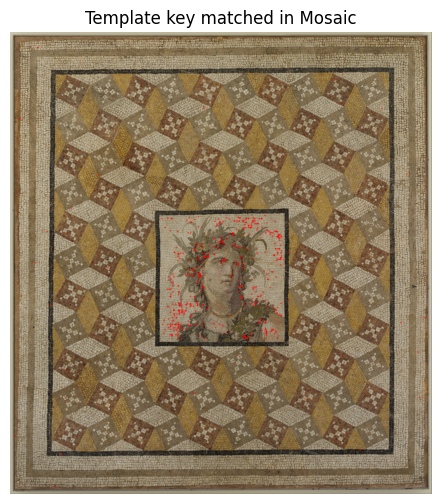

In [101]:
matches = match_features(desc_key, desc_mosaic, pts_key, pts_mosaic)

print(matches)
mosaic_vis = mosaic_rgb.copy()
for (y1, x1), (y2, x2) in matches:
    cv2.circle(mosaic_vis, (x2, y2), 5, (255, 0, 0), 2)

plt.figure(figsize=(10, 6))
plt.imshow(mosaic_vis)
plt.title("Template key matched in Mosaic")
plt.axis("off")
plt.show()

📖 Theory Q: What are potential weaknesses of SSD-based matching compared to modern descriptors like SIFT/ORB?  
Ans: SSD-based matching is sensitive to illumination changes, rotation, and scale variations. It lacks robustness to geometric transformations and lighting conditions. Modern descriptors like SIFT/ORB are rotation and scale invariant, more robust to illumination changes, and use orientation histograms rather than raw pixel intensities.